In [1]:
import Stripeline as Sl
using Healpix
using PRMaps
using Plots

In [3]:
function pipeline_hist(error)
    signal = readMapFromFITS("../input_maps/map_40GHz.fits", 2, Float64)

    days_of_observation = 2.
    fsampl_hz = 59.9
    total_time_s = days_of_observation * 24 * 3600

    setup = Setup(
        τ_s = 1. / fsampl_hz,
        times = 0 : (1. / fsampl_hz) : total_time_s,
        NSIDE = 512
    )

    # We simulate the I0 horn that point towards [0.0,0.0,1.0]
    cam_ang = Sl.CameraAngles()
    
    ideal_map = makeIdealMap(cam_ang, signal, setup)
    
    w2_TA = Sl.TelescopeAngles(wheel2ang_0_rad = error)
    w3_TA = Sl.TelescopeAngles(wheel3ang_0_rad = error)
    fork_TA = Sl.TelescopeAngles(forkang_rad = error)
    wZ_TA = Sl.TelescopeAngles(zVAXang_rad = error)
    wω_TA = Sl.TelescopeAngles(zVAXang_rad = error, omegaVAXang_rad = error)

    w2_Map = makeErroredMap(cam_ang, w2_TA, signal, setup)
    w3_Map = makeErroredMap(cam_ang, w3_TA, signal, setup)
    fork_Map = makeErroredMap(cam_ang, fork_TA, signal, setup)
    wZ_Map = makeErroredMap(cam_ang, wZ_TA, signal, setup)
    wω_Map = makeErroredMap(cam_ang, wω_TA, signal, setup)

    errored_maps = [w2_Map, w3_Map, fork_Map, wZ_Map, wω_Map]
    return (errored_maps, ideal_map)
end

pipeline_hist (generic function with 1 method)

In [4]:
(errored_maps_1deg, ideal_map) = pipeline_hist(deg2rad(1.0))
nothing

In [5]:
error_1 = [ (i - ideal_map)[isfinite.(i-ideal_map)] for i in errored_maps_1deg]
abs_error_1 = [ abs.(i) for i in error_1 ]

error_5 = [ (i - ideal_map)[isfinite.(i-ideal_map)] for i in errored_maps_5deg]
abs_error_5 = [ abs.(i) for i in error_5 ]

labels = ["w2_altitude" "w3_ground" "fork" "wZ" "wω"]

1×5 Matrix{String}:
 "w2_altitude"  "w3_ground"  "fork"  "wZ"  "wω"

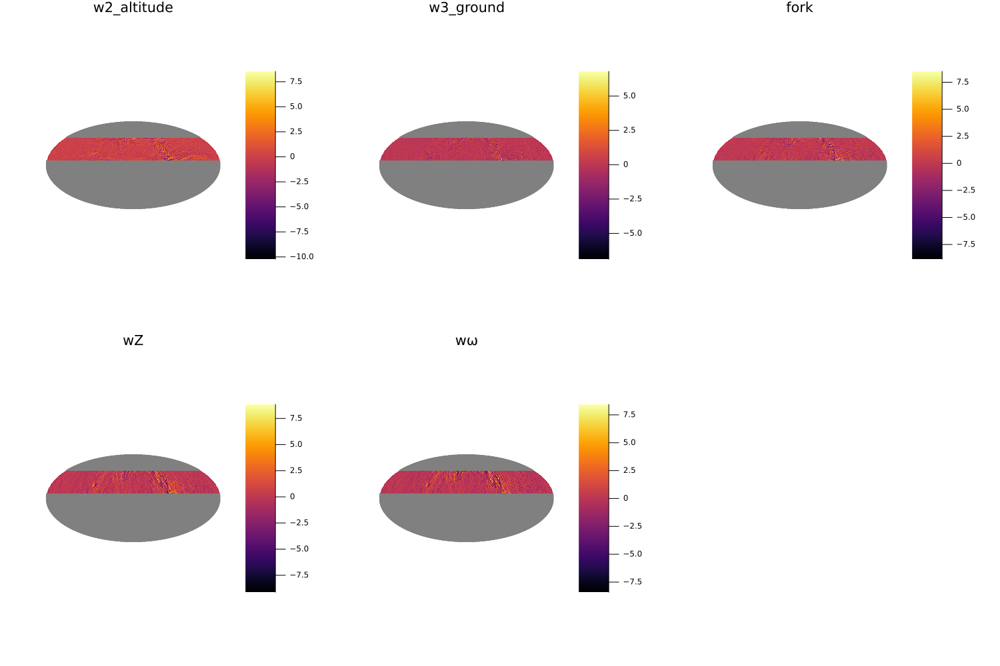

In [13]:
p = [plot(i-ideal_map) for i in errored_maps_1deg]
plot(p..., layout = (2,3), size = (1500,1000), title = labels)

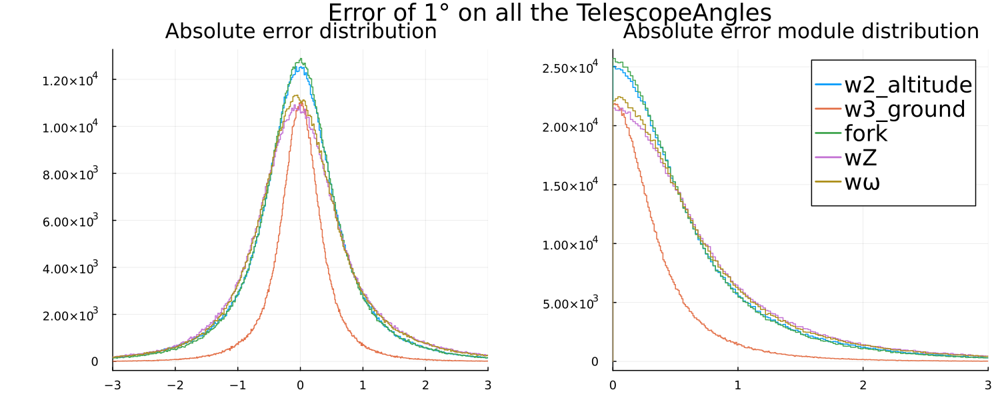

In [7]:
a = stephist([error_1...], label = labels, xlims = (-3,3), legend=false, title = "Absolute error distribution")
b = stephist([abs_error_1...], label = labels, xlims = (0,3), title = "Absolute error module distribution", legendfontsize = 15)
plot(a,b, size = (1500, 600),thickness_scaling = 1.5, plot_title = "Error of 1° on all the TelescopeAngles")

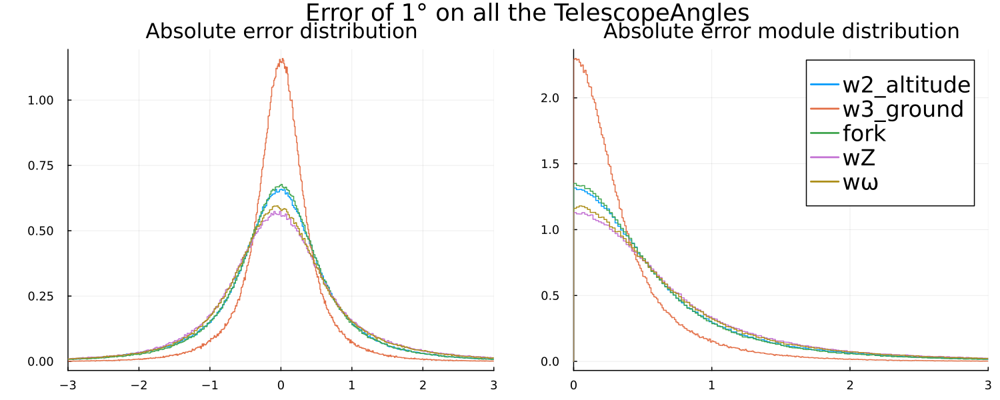

In [8]:
a = stephist([error_1...], label = labels, xlims = (-3,3), normalize = true, legend=false, title = "Absolute error distribution")
b = stephist([abs_error_1...], label = labels, xlims = (0,3), normalize = true, title = "Absolute error module distribution", legendfontsize = 15)
plot(a,b, size = (1500, 600),thickness_scaling = 1.5, plot_title = "Error of 1° on all the TelescopeAngles")

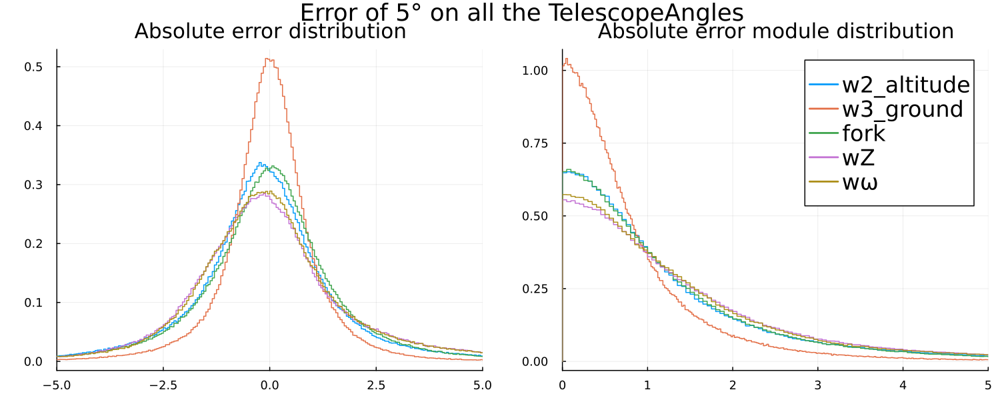

In [9]:
normalize = true
a = stephist([error_5...], label = labels, xlims = (-5,5), normalize = normalize, legend=false, title = "Absolute error distribution")
b = stephist([abs_error_5...], label = labels, xlims = (0,5), normalize = normalize, title = "Absolute error module distribution", legendfontsize = 15)
plot(a,b, size = (1500, 600),thickness_scaling = 1.5, plot_title = "Error of 5° on all the TelescopeAngles")

In [12]:
a = [1,2,3,4]

4-element Vector{Int64}:
 1
 2
 3
 4

In [14]:
a.^2

4-element Vector{Int64}:
  1
  4
  9
 16